In [1]:
import os

import numpy as np
import pandas as pd
import scipy.stats
import seaborn as sns
import simplstyles
from IPython.core.pylabtools import figsize
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
import matplotlib as mpl
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper

In [2]:
from results import get_result_path
from variance_partitioning import signed_square

In [3]:
plt.style.use('nord-light-talk')
# mpl.use('QtAgg')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

/home/leo/PycharmProjects/compare_variance_residual/venv/lib/python3.12/site-packages/himalaya/backend/_utils.py:55: UserWarning: Setting backend to torch_cuda failed: PyTorch not installed..Falling back to numpy backend.
  warnings.warn(f"Setting backend to {backend} failed: {str(error)}."


RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [4]:
modality = "listening"
subject = 5
low_level_feature = "phonemes"
trim = 5  # remove 5 TRs from the start and end of each story
number_of_delays = 4

In [5]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
flatmap_mask = load_hdf5_array(mapper_path, key='flatmap_mask')

# Load EV

In [6]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80069.000000
mean,0.046376
std,0.090718
min,-0.345505
25%,-0.013659
50%,0.036536
75%,0.093954
max,0.556760


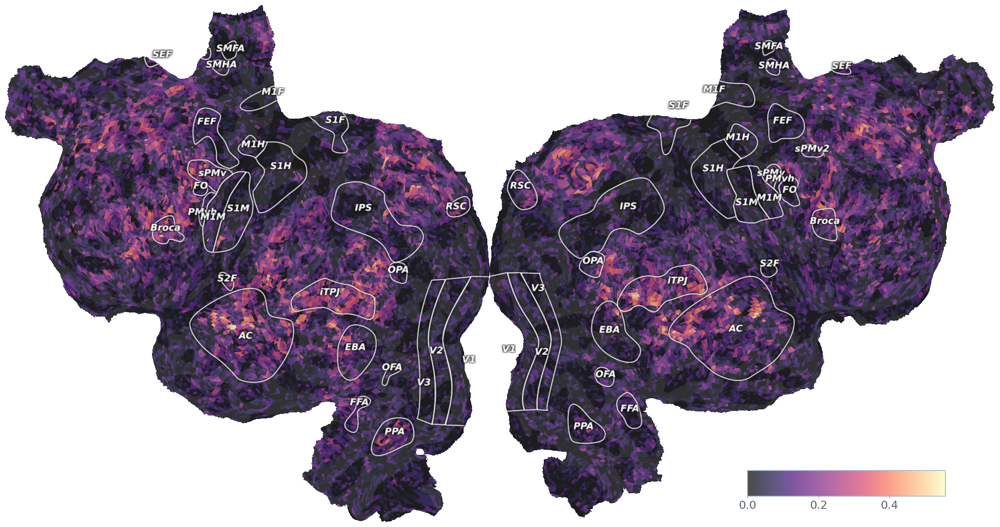

In [7]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Variance Partitioning

## Low Level Prediction

In [8]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [9]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/listening/subject05/phonemes_scores.csv


,correlation_score,r2_score,p_value
count,80069.000000,80615.000000,8.006900e+04
mean,0.026117,0.000777,4.195565e-01
std,0.078523,0.011796,3.097080e-01
min,-0.293730,-0.092860,6.496615e-22
25%,-0.026094,-0.000529,1.305550e-01
50%,0.020485,0.000000,3.874319e-01
75%,0.070945,0.001036,6.872915e-01
max,0.512713,0.253702,9.999953e-01


In [10]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

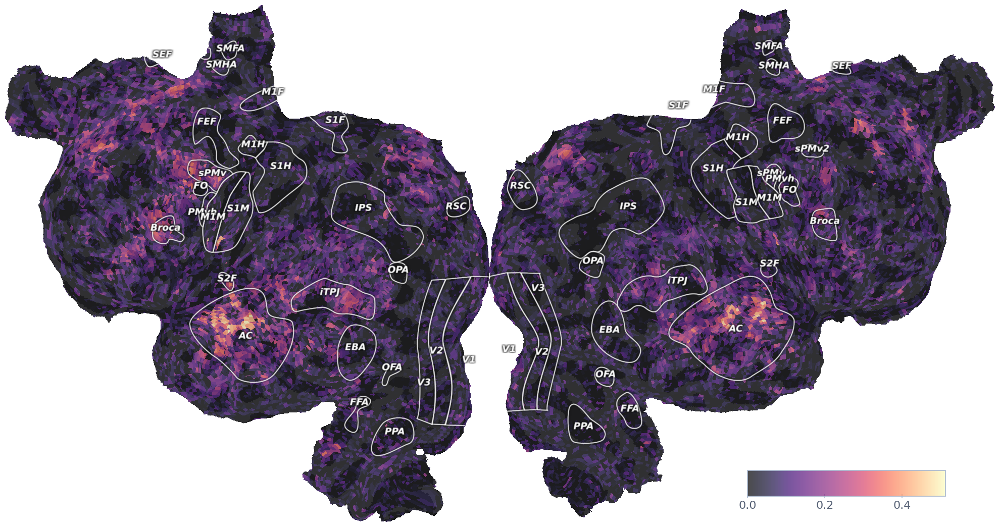

In [11]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

In [12]:
high_ev_voxels = [True if _ev > 0.1 else False for _ev in ev['# ev']]
masked_correlation = np.full(low_level_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[high_ev_voxels] = low_level_correlation[high_ev_voxels]

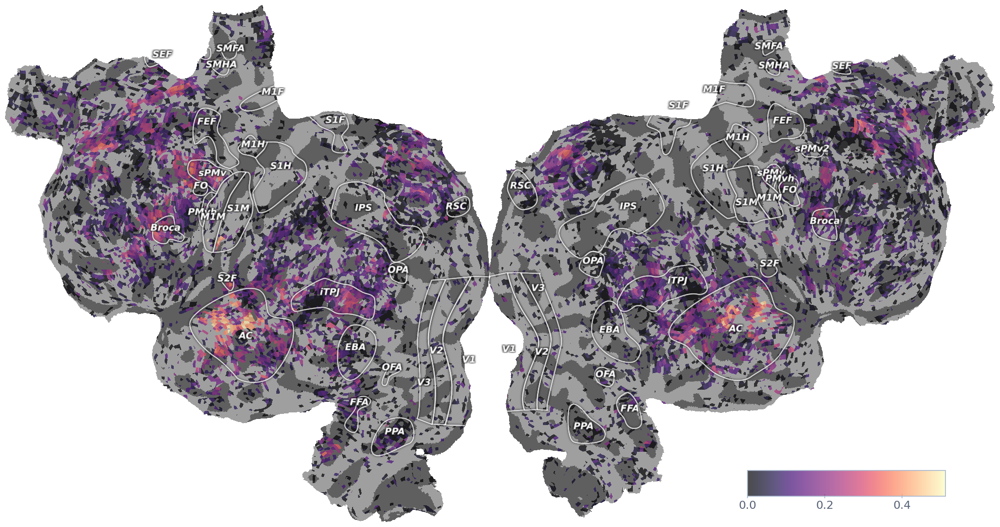

In [13]:
plot_flatmap_from_mapper(masked_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [14]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [15]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80069.000000,80615.000000,8.006900e+04
mean,0.040780,0.004320,3.722965e-01
std,0.098028,0.019929,3.160167e-01
min,-0.304802,-0.138882,3.844813e-27
25%,-0.024512,-0.001086,6.621909e-02
50%,0.028828,0.000000,3.144968e-01
75%,0.090970,0.003145,6.416600e-01
max,0.564427,0.236050,9.999848e-01


In [16]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

significant_voxels = [True if p_value < 0.05 else False for p_value in semantic_scores['p_value']]
masked_correlation = np.full(semantic_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = semantic_correlation[significant_voxels]

0.5644265361655587


In [ ]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05])


## Joint Prediction

In [58]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [59]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80069.000000,80615.000000,8.006900e+04
mean,0.042185,0.004201,3.782177e-01
std,0.098093,0.021735,3.161780e-01
min,-0.276732,-0.106164,5.101638e-27
25%,-0.022766,-0.002316,7.287102e-02
50%,0.029086,0.000000,3.237398e-01
75%,0.089986,0.003646,6.489551e-01
max,0.563309,0.253657,9.999959e-01


In [60]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

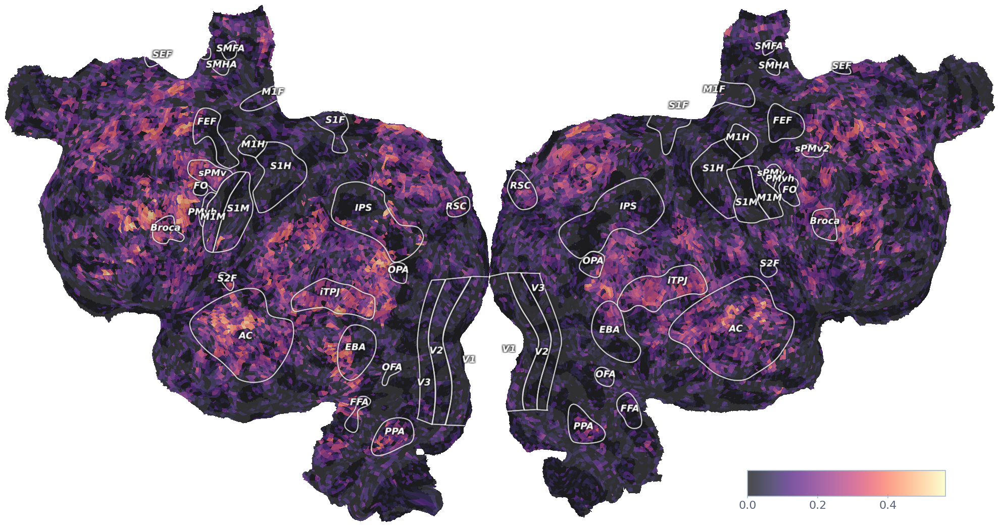

In [61]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

## Perform Variance Partitioning

In [62]:
intersection = signed_square(low_level_scores['correlation_score']) + signed_square(
    semantic_scores['correlation_score']) - signed_square(joint_scores['correlation_score'])
semantic_minus_low_level = signed_square(semantic_scores['correlation_score']) - intersection
semantic_minus_low_level = np.nan_to_num(semantic_minus_low_level)
scipy.stats.describe(semantic_minus_low_level)

DescribeResult(nobs=80615, minmax=(np.float64(-0.09140082690174245), np.float64(0.2676323382466512)), mean=np.float64(0.004484559673748874), variance=np.float64(0.00035119083244313925), skewness=np.float64(4.068217042359861), kurtosis=np.float64(25.518215940872306))

In [63]:
semantic_minus_low_level = np.sqrt(semantic_minus_low_level)
semantic_minus_low_level = np.nan_to_num(semantic_minus_low_level)
scipy.stats.describe(semantic_minus_low_level)

/tmp/ipykernel_51634/1687048531.py:1: RuntimeWarning: invalid value encountered in sqrt
  semantic_minus_low_level = np.sqrt(semantic_minus_low_level)


DescribeResult(nobs=80615, minmax=(np.float64(0.0), np.float64(0.5173319420320489)), mean=np.float64(0.040979247510382254), variance=np.float64(0.0046549057877483145), skewness=np.float64(2.186530853673556), kurtosis=np.float64(5.289956565229735))

In [64]:
semantic_minus_low_level = signed_square(joint_scores['correlation_score']) - signed_square(
    low_level_scores['correlation_score'])
semantic_minus_low_level = np.nan_to_num(semantic_minus_low_level)
scipy.stats.describe(semantic_minus_low_level)

DescribeResult(nobs=80615, minmax=(np.float64(-0.09140082690174246), np.float64(0.2676323382466512)), mean=np.float64(0.004484559673748874), variance=np.float64(0.00035119083244313925), skewness=np.float64(4.068217042359861), kurtosis=np.float64(25.518215940872306))

In [65]:
semantic_minus_low_level = np.sqrt(semantic_minus_low_level)
semantic_minus_low_level = np.nan_to_num(semantic_minus_low_level)
scipy.stats.describe(semantic_minus_low_level)

/tmp/ipykernel_51634/1687048531.py:1: RuntimeWarning: invalid value encountered in sqrt
  semantic_minus_low_level = np.sqrt(semantic_minus_low_level)


DescribeResult(nobs=80615, minmax=(np.float64(0.0), np.float64(0.5173319420320489)), mean=np.float64(0.040979247510382254), variance=np.float64(0.0046549057877483145), skewness=np.float64(2.186530853673556), kurtosis=np.float64(5.289956565229733))

In [66]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [67]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic$\cap$phonemes,semantic\phonemes,joint\phonemes
count,80069.000000,50894.000000,45337.000000
mean,0.003654,0.092792,0.072866
std,0.013182,0.080234,0.077159
min,-0.092883,0.000021,0.000019
25%,-0.000942,0.033575,0.005307
50%,0.000478,0.070256,0.053200
75%,0.005170,0.128779,0.106824
max,0.210438,0.562123,0.517332


In [68]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level
vmax = vp_correlation.max()

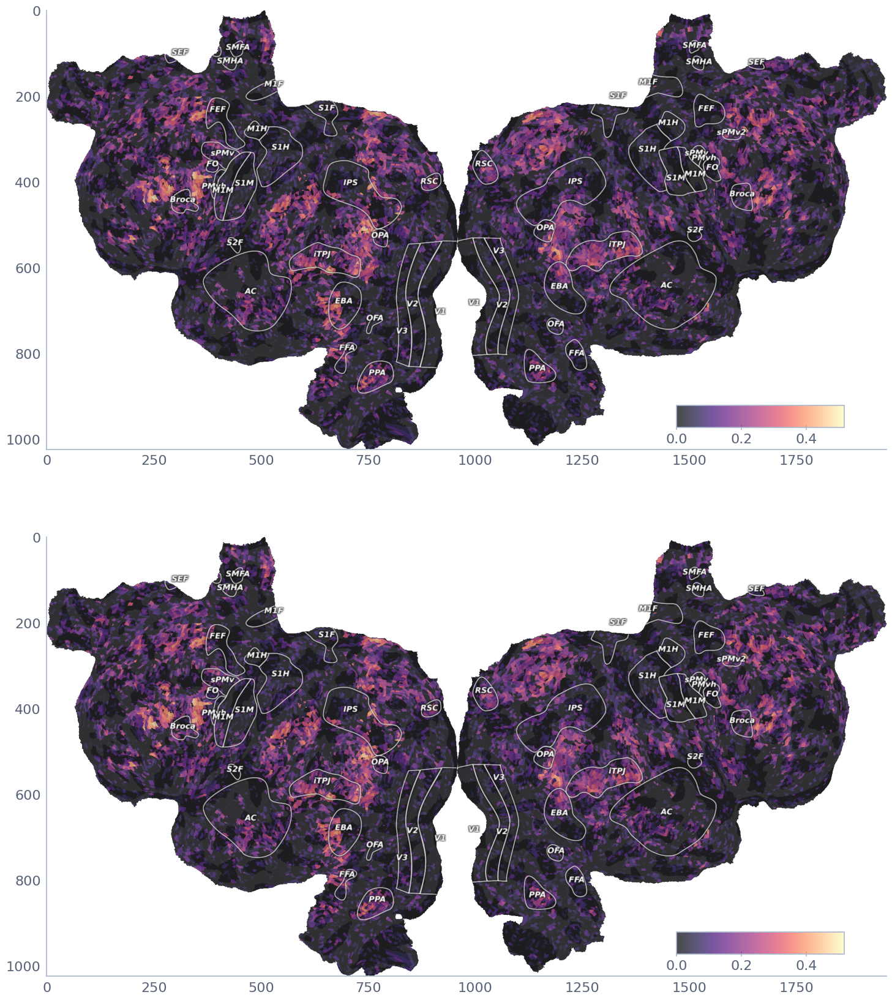

In [69]:
fig, axs = plt.subplots(2, 1, figsize=(flatmap_mask.shape[0] / 100, flatmap_mask.shape[1] / 100 * 2))
for i, corr in enumerate([np.nan_to_num(vp_scores[f'semantic\\{low_level_feature}']), np.nan_to_num(vp_scores[f'joint\\{low_level_feature}'])]):
    ax = axs[i]
    plot_flatmap_from_mapper(vp_correlation, mapper_path, vmin=0,
                             vmax=vmax,ax = ax,
                             colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Residual Method

In [70]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")

In [71]:
r2_scores = pd.read_csv(cross_path)

<Axes: ylabel='Count'>

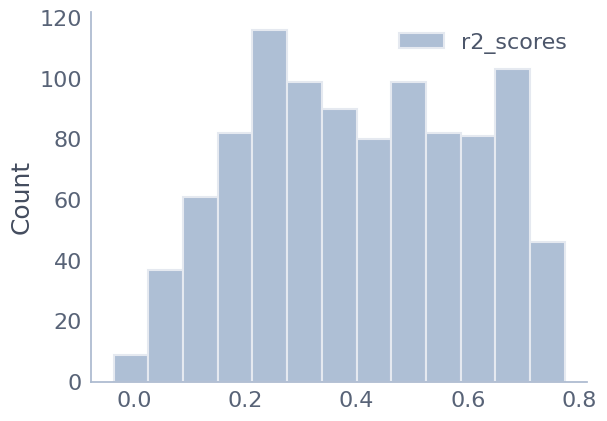

In [72]:
sns.histplot(r2_scores)

## Create Residuals

In [73]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [74]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80069.000000,80615.000000,8.006900e+04
mean,40307.000000,0.035759,0.003322,3.886487e-01
std,23271.690312,0.092848,0.015987,3.146325e-01
min,0.000000,-0.304482,-0.091160,1.256419e-22
25%,20153.500000,-0.025704,-0.000143,8.552862e-02
50%,40307.000000,0.025159,0.000000,3.415577e-01
75%,60460.500000,0.083039,0.001526,6.579989e-01
max,80614.000000,0.520318,0.233498,9.999778e-01


In [75]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

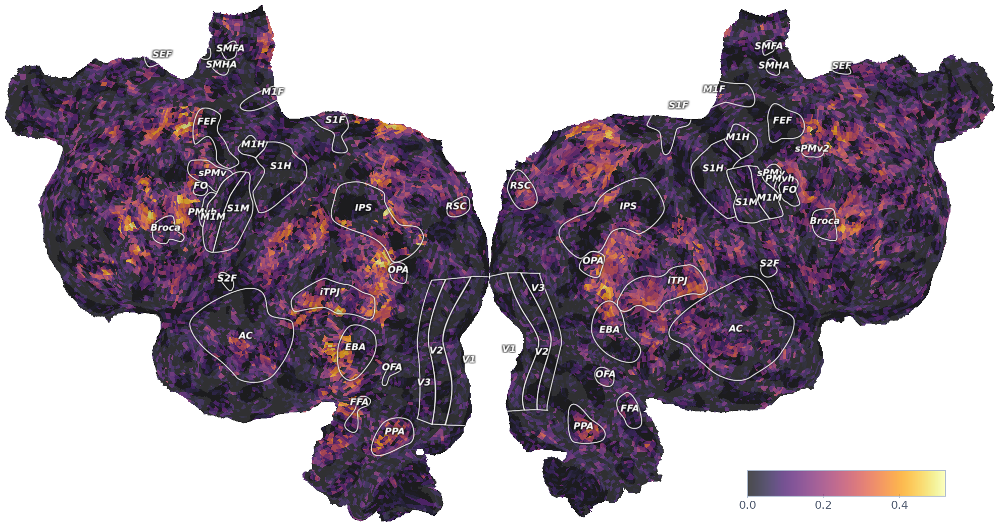

In [76]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

<Axes: >

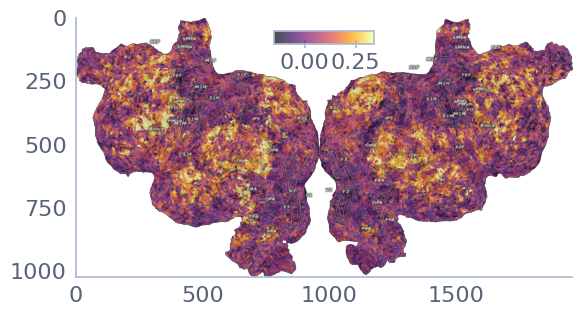

In [77]:
ax = plt.subplot()
plot_flatmap_from_mapper(semantic_correlation, mapper_path, ax=ax)

<Axes: >

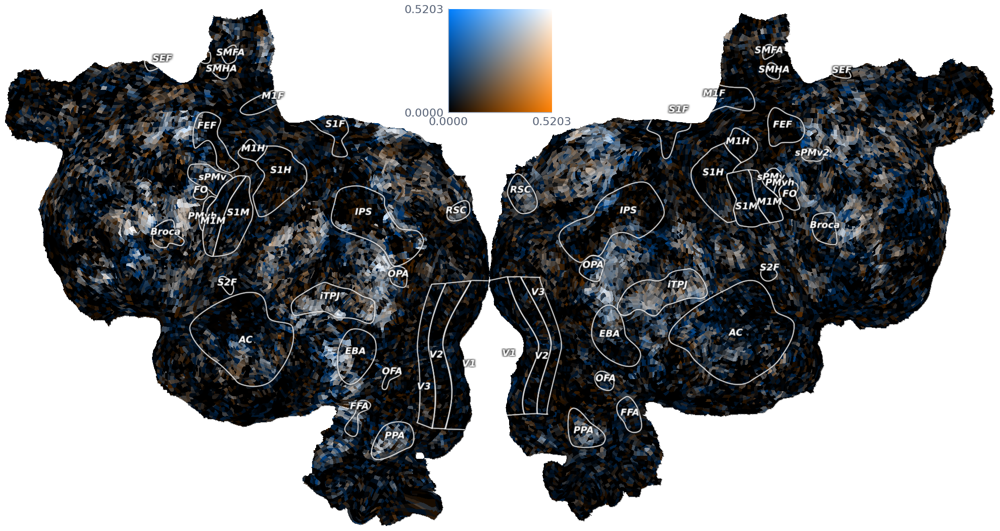

In [78]:
vmin = 0
vmax = max(vp_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(vp_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                            vmax2=vmax, colorbar_location=(.4, .8, 0.2, 0.2), alpha=1)

# Plot visual cortex side by side

/tmp/ipykernel_51634/2149635237.py:32: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


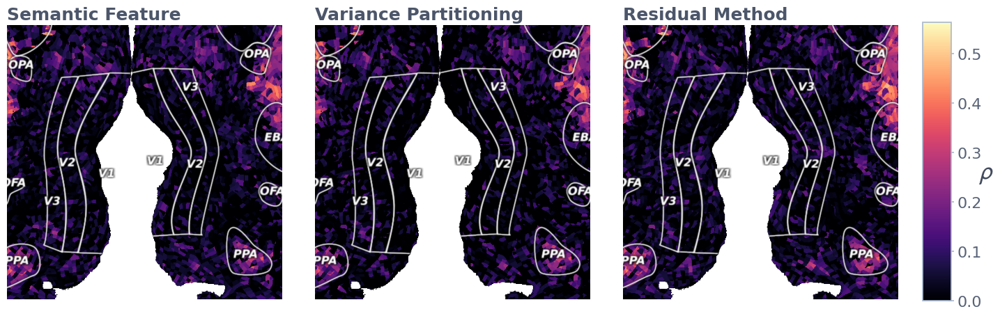

In [79]:
viewport_size = 450
fig, axs = plt.subplots(1, 3, figsize=(viewport_size / 100 * 3, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

for i, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation],
                                     ["Semantic Feature", "Variance Partitioning", "Residual Method"])):
    ax = axs[i]
    ax.axis('off')
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_51634/2768811120.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


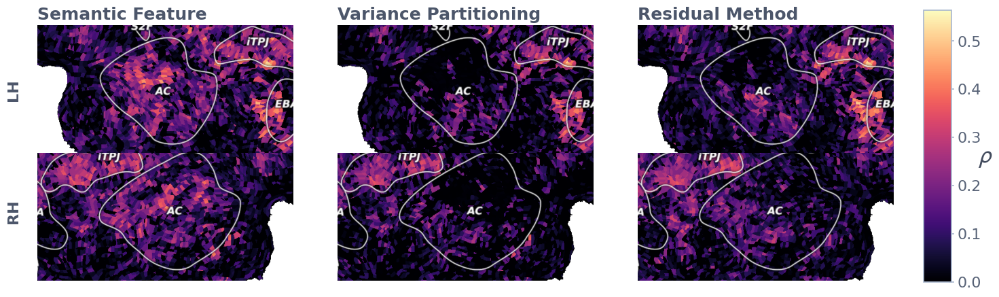

In [80]:
viewport_size = 450
fig, axs = plt.subplots(2, 3, figsize=(viewport_size / 100 * 3, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation],
                                           ["Semantic Feature", "Variance Partitioning", "Residual Method"])):
        ax = axs[row, col]

        ax.axis('off')
        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()